###Initializare
Importam librariile pentru algebra liniara si ne conectam la contul Google Drive

In [1]:
import numpy as np # pentru algebra liniara

# conectarea la Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# import setul de date CSV
import pandas as pd # procesarea datelor, I/O pentru fisiere CSV (de exemplu, pd.read_csv)

In [3]:
# calea spre fisier
path="/content/drive/MyDrive/Cancer_Data.csv"

###Citire date
Citim apoi datele din fisier, si le afisam cu functia df.head()

In [4]:
#citire fisier
df = pd.read_csv(path, delimiter=',')

#afisare date incarcate
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,Malignant,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,Malignant,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,Malignant,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,Malignant,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,Malignant,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


###Interogare baza de date
In acest pas interogam baza de date sa vedem cate coloane si linii avem in fisierul de antrenare

In [5]:
#aceasta functie ne arata cate date avem in tabel
df.shape

(569, 32)

###Info baza de date
Folosim functia info() pentru a afla informatii despre coloane

In [6]:
#interogam informatiile despre coloanele din baza de date de antrenament
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

###Valori lipsa
Nr de valori lipsa pentru fiecare coloana

In [7]:
df.isnull().sum().sort_values(ascending=False)

id                         0
diagnosis                  0
symmetry_worst             0
concave points_worst       0
concavity_worst            0
compactness_worst          0
smoothness_worst           0
area_worst                 0
perimeter_worst            0
texture_worst              0
radius_worst               0
fractal_dimension_se       0
symmetry_se                0
concave points_se          0
concavity_se               0
compactness_se             0
smoothness_se              0
area_se                    0
perimeter_se               0
texture_se                 0
radius_se                  0
fractal_dimension_mean     0
symmetry_mean              0
concave points_mean        0
concavity_mean             0
compactness_mean           0
smoothness_mean            0
area_mean                  0
perimeter_mean             0
texture_mean               0
radius_mean                0
fractal_dimension_worst    0
dtype: int64

Observam ca baza de date este completa, si nu avem valori lipsa.

###Explorarea datelor

Numaram cate tipuri din fiecare diagnostic avem

In [8]:
#numaram cate tipuri de diagostic avem in baza de date din fiecare (benign si malignant)
df.diagnosis.value_counts()

Benign       357
Malignant    212
Name: diagnosis, dtype: int64

###Vizualizarea bazei de date

Vom importa cateva biblioteci pentru vizualizarea datelor statistice si de asemeni pentru crearea de grafice si diagrame intr-o gama larga de stiluri si formate

In [9]:
#importam biblioteca seaborn pentru vizualizarea datelor statistice - grafice, diagrame
import seaborn as sns
#importam biblioteca matplotlib care pertmite vizulizarea datelor 2d in mai multe stiluri si formate
import matplotlib.pyplot as plt

Vizualizam datele in functie de zona medie afectata

In [10]:
sns.pairplot(df, hue='radius_mean', corner=True)

<Axes: xlabel='texture_mean', ylabel='count'>

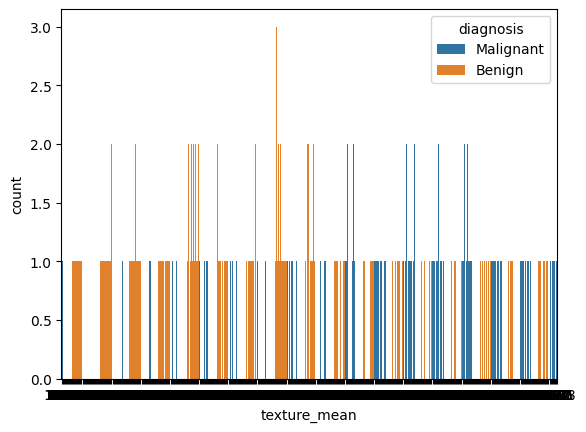

In [11]:
sns.countplot(x="texture_mean", hue="diagnosis", data=df)

In [12]:
corr = df.corr()

<ipython-input-12-45893e33df67>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr()


### Corelanta

<Axes: >

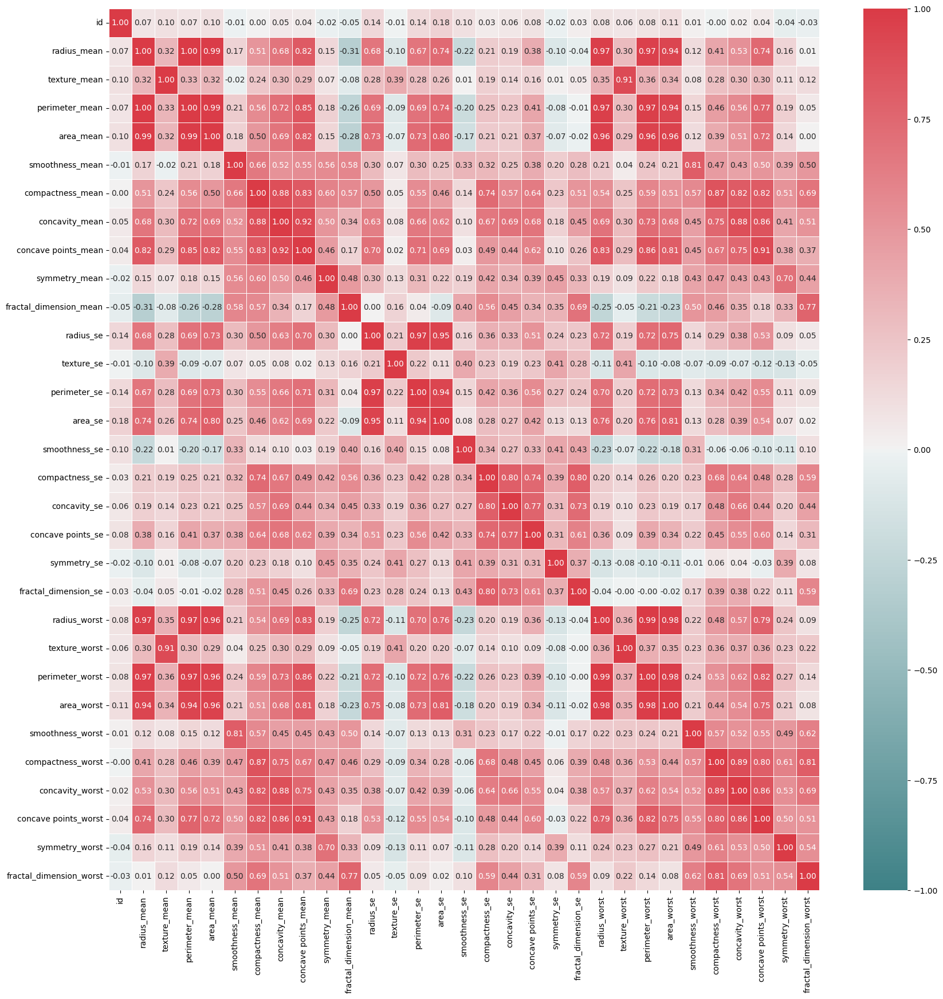

In [13]:
plt.subplots(figsize=(20, 20))
sns.heatmap(corr, annot=True,cmap=sns.diverging_palette(200, 10, as_cmap=True), vmin=-1, vmax=1, linewidths=.5, fmt=".2f")

Observam ca 'radius_mean', 'parameter_mean' si 'area_mean' sunt puternic corelate pozitiv.

### Output:

Deoarece am avut un set de date dezechilibrat in ceea ce priveste diagnosticul, am impartit astfel:

1 - Malignant
0 - Benign

In [14]:
df["diagnosis"] = df["diagnosis"].map({'Malignant':1,'Benign':0})
y = df["diagnosis"]

### Afisam nr. de diagnostice de fiecare tip:

In [15]:
y.value_counts()

0    357
1    212
Name: diagnosis, dtype: int64

### Afisare Y:

In [16]:
y

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int64

### Stergerea unei coloane
Am considerat ca nu e necesara coloana de id si am sters-o

In [17]:
x = df.drop(["id", "diagnosis"], axis=1)

### Afisarea X

In [18]:
x

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


## Antrenarea modelului
Importam bibliotecile pentru invatare din biblioteca Python sklearn care vor fi utilizate pentru a efectua invatarea automata



In [19]:
from sklearn.model_selection import train_test_split #pentru a imparti setul de date
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix

Vom crea un nou obiect care va contine doua coloane:

1. model
2. accuracy

In [20]:
log = pd.DataFrame(columns=["model", "accuracy"])

###Impartire set de date Antrenament/testare
Impartim setul de date in set de antrenament si set de testare

In [21]:
# Split the dataset into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [22]:
x

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [23]:
y

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int64

In [24]:
x_train.shape

(455, 30)

In [25]:
y_train.shape

(455,)

In [26]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
# Define the neural model
model = Sequential()
model.add(Dense(30, input_dim=30, activation='relu'))
model.add(Dense(30, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [27]:
# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [28]:
# Train the model
model.fit(x_train, y_train, epochs=500, batch_size=32, verbose=1)

Epoch 1/500
15/15 [==============================] - 1s 2ms/step - loss: 3.4304 - accuracy: 0.5253
Epoch 2/500
15/15 [==============================] - 0s 2ms/step - loss: 2.1585 - accuracy: 0.6242
Epoch 3/500
15/15 [==============================] - 0s 2ms/step - loss: 1.7797 - accuracy: 0.6725
Epoch 4/500
15/15 [==============================] - 0s 2ms/step - loss: 1.3402 - accuracy: 0.7187
Epoch 5/500
15/15 [==============================] - 0s 2ms/step - loss: 0.8767 - accuracy: 0.8000
Epoch 6/500
15/15 [==============================] - 0s 2ms/step - loss: 0.6829 - accuracy: 0.8176
Epoch 7/500
15/15 [==============================] - 0s 2ms/step - loss: 0.5964 - accuracy: 0.8396
Epoch 8/500
15/15 [==============================] - 0s 2ms/step - loss: 0.6241 - accuracy: 0.8374
Epoch 9/500
15/15 [==============================] - 0s 2ms/step - loss: 0.4648 - accuracy: 0.8725
Epoch 10/500
15/15 [==============================] - 0s 3ms/step - loss: 0.6283 - accuracy: 0.8154
Epoch 11/

In [29]:
# Evaluate the model on train data
train_loss, train_accuracy = model.evaluate(x_train, y_train, verbose=0)
print('Train Accuracy: {:.2f}%'.format(train_accuracy * 100))

Train Accuracy: 96.92%


In [30]:
# Evaluate the model on test data
test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=0)
print('Test Accuracy: {:.2f}%'.format(test_accuracy * 100))

Test Accuracy: 96.49%


In [31]:
from sklearn.metrics import confusion_matrix
# Evaluate the model on test data
y_pred = model.predict(x_test)
cm = confusion_matrix(y_test, y_pred.round())

print('Confusion Matrix:')
print(cm)

4/4 [==============================] - 0s 3ms/step
Confusion Matrix:
[[71  0]
 [ 4 39]]


In [32]:
# Define the neural model
model = Sequential()
model.add(Dense(20, input_dim=30, activation='relu'))
model.add(Dense(30, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [33]:
# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [34]:
# Train the model
model.fit(x_train, y_train, epochs=200, batch_size=32, verbose=1)

Epoch 1/200
15/15 [==============================] - 1s 3ms/step - loss: 8.1239 - accuracy: 0.3890
Epoch 2/200
15/15 [==============================] - 0s 2ms/step - loss: 4.2272 - accuracy: 0.3758
Epoch 3/200
15/15 [==============================] - 0s 2ms/step - loss: 2.2856 - accuracy: 0.4330
Epoch 4/200
15/15 [==============================] - 0s 2ms/step - loss: 0.9235 - accuracy: 0.5099
Epoch 5/200
15/15 [==============================] - 0s 2ms/step - loss: 0.6237 - accuracy: 0.6747
Epoch 6/200
15/15 [==============================] - 0s 2ms/step - loss: 0.6106 - accuracy: 0.7275
Epoch 7/200
15/15 [==============================] - 0s 3ms/step - loss: 0.5435 - accuracy: 0.7495
Epoch 8/200
15/15 [==============================] - 0s 2ms/step - loss: 0.4820 - accuracy: 0.8176
Epoch 9/200
15/15 [==============================] - 0s 2ms/step - loss: 0.4206 - accuracy: 0.8330
Epoch 10/200
15/15 [==============================] - 0s 2ms/step - loss: 0.4663 - accuracy: 0.8132
Epoch 11/

In [35]:
# Evaluate the model on train data
train_loss, train_accuracy = model.evaluate(x_train, y_train, verbose=0)
print('Train Accuracy: {:.2f}%'.format(train_accuracy * 100))

Train Accuracy: 93.85%


In [36]:
# Evaluate the model on test data
test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=0)
print('Test Accuracy: {:.2f}%'.format(test_accuracy * 100))

Test Accuracy: 96.49%
